In [1]:
# -*- coding: utf-8 -*-
import os, sys
import glob
import json
sys.path.append("..")
sys.path.append("../..")
import dataset_utils.utils
import dataset_utils.config as config
import pympi
import sklearn.metrics as metrics
from collections import defaultdict
import copy
import pickle
import utils
import smoothing_methods

In [2]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt

In [3]:
prediction_dir = os.path.join(config.DS_DIALOG, "detection_result")
ant_dir = os.path.join(config.DS_DIALOG, "ant")
img_dir = os.path.join(config.DS_DIALOG, "image")
meta_dir = os.path.join(config.DS_DIALOG, "meta_info")
movie_files = ["01_01.MP4", "01_02.MP4", "02_01.MP4", "02_02.MP4", "03_01.MP4", "03_02.MP4", "04_01.MP4", "04_02.MP4", "05_01.MP4", "05_02.MP4"]
fig_dir = os.path.join(config.DS_DIALOG, "figure")
if not os.path.exists(fig_dir):
    os.mkdir(fig_dir)

## シングルフレーム検出の結果分析 (raw)

In [4]:
test_ids = [("05_01", "A"), ("05_01", "C"), ("05_01", "D"), ("05_02", "A"), ("05_02", "C"), ("05_02", "D")]

In [6]:
for movie_id, seat_id in test_ids:
    frame_num = utils.frame_num(img_dir, movie_id)
    labels = utils.load_ts(movie_id, seat_id, ant_dir, frame_num)
    preds = utils.load_xs(movie_id, seat_id, prediction_dir, frame_num, "score")
    preds = [float(pred) for pred in preds]
    # visualize result
    fig_path = "./figure/raw/%s_%s.png" % (movie_id, seat_id)
    title="Raw: %s_%s" % (movie_id, seat_id)
#     utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))

Parsing unknown version of ELAN spec... This could result in errors...
05_01_A
f1_score: 0.829452
auc_score: 0.863523
Parsing unknown version of ELAN spec... This could result in errors...
05_01_C
f1_score: 0.793440
auc_score: 0.936829
Parsing unknown version of ELAN spec... This could result in errors...
05_01_D
f1_score: 0.845833
auc_score: 0.937051
Parsing unknown version of ELAN spec... This could result in errors...
05_02_A
f1_score: 0.852743
auc_score: 0.916457
Parsing unknown version of ELAN spec... This could result in errors...
05_02_C
f1_score: 0.788118
auc_score: 0.927384
Parsing unknown version of ELAN spec... This could result in errors...
05_02_D
f1_score: 0.873921
auc_score: 0.958642
f1_score (average): 0.830584
auc_score (average): 0.923314


## 移動平均による平滑化の結果分析 (average)

In [12]:
def get_all_dataset_ids(img_dir, meta_dir):
    movie_ids = sorted([dname for dname in os.listdir(img_dir) if dname[0] != '.'])
    movie_ids = [(movie_id.split("_")[0], movie_id.split("_")[1]) for movie_id in movie_ids]
    dataset_ids = []
    for group_id, session_id in movie_ids:
        meta_path = os.path.join(meta_dir, "%s.json" % group_id)
        meta_info = json.load(open(meta_path))
        for seat_id in sorted(meta_info.keys()):
            dataset_ids.append((group_id, session_id, seat_id))
    return dataset_ids

In [44]:
def search_best_window_size(test_group_id):
    dataset_ids = get_all_dataset_ids(img_dir, meta_dir)
    dataset_ids = [dataset_id for dataset_id in dataset_ids if int(dataset_id[0]) != test_group_id]
     
    result = defaultdict(list)

    for group_id, session_id, seat_id in dataset_ids:
        movie_id = "%s_%s" % (group_id, session_id)    
        frame_num = utils.frame_num(img_dir, movie_id)
        ts = utils.load_ts(movie_id, seat_id, ant_dir, frame_num)
        ys = utils.load_xs(movie_id, seat_id, prediction_dir, frame_num, "score")
        preds = [float(y) for y in ys]
        for window in range(2, 25):
            ave_scores = []
            ave_preds = smoothing_methods.pre_average_predictions(preds, window=window)
            score = metrics.roc_auc_score(ts, ave_preds)
            result[window].append(score)
    return max(result, key=lambda key: sum(result[key])/len(result[key]))

In [4]:
best_window_size = search_best_window_size(5)
print(best_window_size)

NameError: name 'search_best_window_size' is not defined

Parsing unknown version of ELAN spec... This could result in errors...


/usr/local/lib/python2.7/dist-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


05_01_A
f1_score: 0.828877
auc_score: 0.876969
Parsing unknown version of ELAN spec... This could result in errors...
05_01_C
f1_score: 0.827662
auc_score: 0.957194
Parsing unknown version of ELAN spec... This could result in errors...
05_01_D
f1_score: 0.850167
auc_score: 0.944172
Parsing unknown version of ELAN spec... This could result in errors...
05_02_A
f1_score: 0.861914
auc_score: 0.927306
Parsing unknown version of ELAN spec... This could result in errors...
05_02_C
f1_score: 0.830473
auc_score: 0.954605
Parsing unknown version of ELAN spec... This could result in errors...
05_02_D
f1_score: 0.883815
auc_score: 0.967415
f1_score (average): 0.847151
auc_score (average): 0.937943


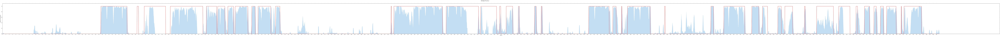

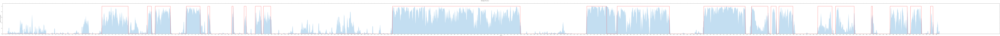

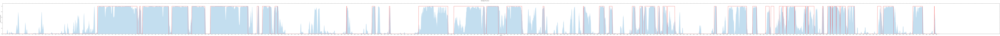

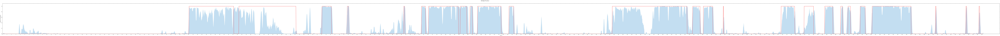

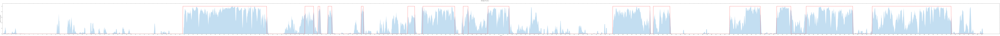

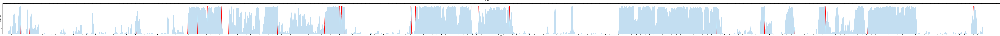

In [48]:
f1_scores = []
auc_scores = []
for movie_id, seat_id in test_ids:
    frame_num = utils.frame_num(img_dir, movie_id)
    labels = utils.load_ts(movie_id, seat_id, ant_dir, frame_num)
    preds = utils.load_xs(movie_id, seat_id, prediction_dir, frame_num, "score")
    
    preds = [float(pred) for pred in preds]
    preds = smoothing_methods.pre_average_predictions(preds, window=best_window_size)
    
    # visualize result
    fig_path = "./figure/average/%s_%s.png" % (movie_id, seat_id)
    title="Average: %s_%s" % (movie_id, seat_id)
    utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))

## LSTM

05_01_A
f1_score: 0.853644
auc_score: 0.922047
05_01_C
f1_score: 0.890898
auc_score: 0.964032
05_01_D
f1_score: 0.842786
auc_score: 0.944176
05_02_A
f1_score: 0.896383
auc_score: 0.959187
05_02_C
f1_score: 0.854043
auc_score: 0.948303
05_02_D
f1_score: 0.876245
auc_score: 0.966428
f1_score (average): 0.869000
auc_score (average): 0.950696


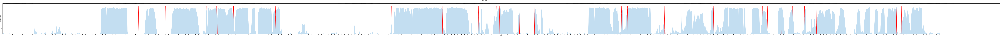

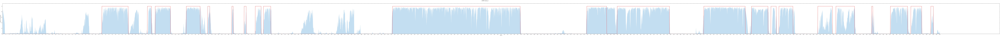

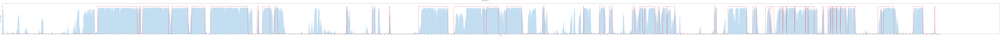

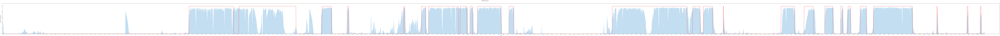

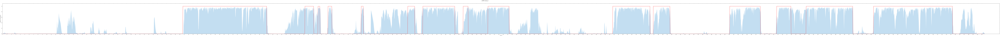

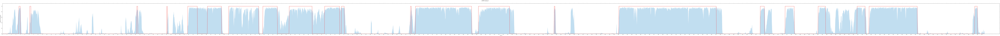

In [10]:
f1_scores = []
auc_scores = []
for movie_id, seat_id in test_ids:
    path = os.path.join("./prediction", "%s_%s.pickle" % (movie_id, seat_id))
    labels, preds = pickle.load(open(path, "r"))
    preds = [pred[1] for pred in preds]
    frame_num = len(labels)
    
    # visualize result
    fig_path = "./figure/lstm/%s_%s.png" % (movie_id, seat_id)
    title="LSTM: %s_%s" % (movie_id, seat_id)
    utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))

## 学習データサイズごと

### 学習データサイズ1

In [58]:
f1_scores = []
auc_scores = []
for movie_id, seat_id in test_ids:
    path = os.path.join("./test_result/data_size_01", "%s_%s.pickle" % (movie_id, seat_id))
    labels, preds = pickle.load(open(path, "r"))
    preds = [pred[1] for pred in preds]
    frame_num = len(labels)
    
    # visualize result
    fig_path = "./figure/lstm/%s_%s.png" % (movie_id, seat_id)
    title="LSTM: %s_%s" % (movie_id, seat_id)
#     utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))

05_01_A
f1_score: 0.856106
auc_score: 0.898006
05_01_C
f1_score: 0.889832
auc_score: 0.959307
05_01_D
f1_score: 0.838431
auc_score: 0.948025
05_02_A
f1_score: 0.865549
auc_score: 0.933526
05_02_C
f1_score: 0.861714
auc_score: 0.956209
05_02_D
f1_score: 0.882541
auc_score: 0.968623
f1_score (average): 0.865696
auc_score (average): 0.943949


### 学習データサイズ2

In [63]:
f1_scores = []
auc_scores = []
for movie_id, seat_id in test_ids:
    path = os.path.join("./test_result/data_size_02", "%s_%s.pickle" % (movie_id, seat_id))
    labels, preds = pickle.load(open(path, "r"))
    preds = [pred[1] for pred in preds]
    frame_num = len(labels)
    
    # visualize result
    fig_path = "./figure/lstm/%s_%s.png" % (movie_id, seat_id)
    title="LSTM: %s_%s" % (movie_id, seat_id)
#     utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))

05_01_A
f1_score: 0.839411
auc_score: 0.893778
05_01_C
f1_score: 0.895838
auc_score: 0.970892
05_01_D
f1_score: 0.831304
auc_score: 0.939306
05_02_A
f1_score: 0.888609
auc_score: 0.938453
05_02_C
f1_score: 0.877193
auc_score: 0.966094
05_02_D
f1_score: 0.883511
auc_score: 0.970026
f1_score (average): 0.869311
auc_score (average): 0.946425


### 学習データサイズ3

In [60]:
f1_scores = []
auc_scores = []
for movie_id, seat_id in test_ids:
    path = os.path.join("./test_result/data_size_03", "%s_%s.pickle" % (movie_id, seat_id))
    labels, preds = pickle.load(open(path, "r"))
    preds = [pred[1] for pred in preds]
    frame_num = len(labels)
    
    # visualize result
    fig_path = "./figure/lstm/%s_%s.png" % (movie_id, seat_id)
    title="LSTM: %s_%s" % (movie_id, seat_id)
#     utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))

05_01_A
f1_score: 0.859587
auc_score: 0.922216
05_01_C
f1_score: 0.911524
auc_score: 0.970658
05_01_D
f1_score: 0.834929
auc_score: 0.949684
05_02_A
f1_score: 0.884211
auc_score: 0.954635
05_02_C
f1_score: 0.884615
auc_score: 0.968198
05_02_D
f1_score: 0.887242
auc_score: 0.973055
f1_score (average): 0.877018
auc_score (average): 0.956408


# モデルの比較

## Attention LSTM

05_01_A
f1_score: 0.871710
auc_score: 0.960366
05_01_C
f1_score: 0.904320
auc_score: 0.971665
05_01_D
f1_score: 0.836134
auc_score: 0.942375
05_02_A
f1_score: 0.900629
auc_score: 0.971169
05_02_C
f1_score: 0.877545
auc_score: 0.959141
05_02_D
f1_score: 0.891798
auc_score: 0.969894
f1_score (average): 0.880356
auc_score (average): 0.962435


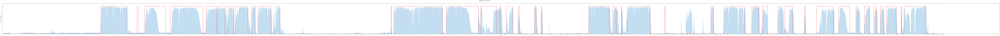

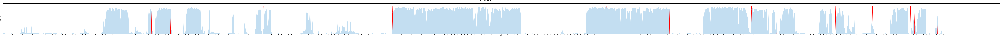

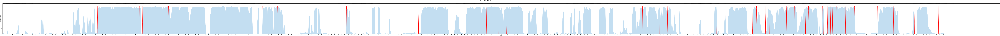

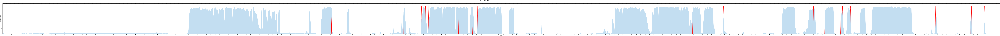

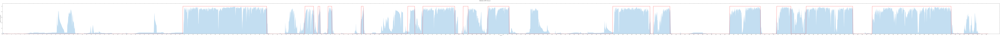

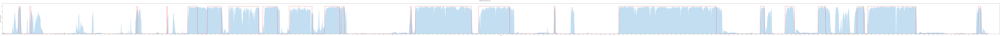

In [24]:
f1_scores = []
auc_scores = []
for movie_id, seat_id in test_ids:
    path = os.path.join("./test_result/model_compare_atlstm_02", "%s_%s.pickle" % (movie_id, seat_id))
    labels, preds = pickle.load(open(path, "r"))
    preds = [pred[1] for pred in preds]
    frame_num = len(labels)
    
    # visualize result
    fig_path = "./figure/atlstm/%s_%s.png" % (movie_id, seat_id)
    title="Attention LSTM: %s_%s" % (movie_id, seat_id)
    utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))

## LSTM

In [23]:
f1_scores = []
auc_scores = []
for movie_id, seat_id in test_ids:
    path = os.path.join("./test_result/model_compare_lstm_02", "%s_%s.pickle" % (movie_id, seat_id))
    labels, preds = pickle.load(open(path, "r"))
    preds = [pred[1] for pred in preds]
    frame_num = len(labels)
    
    # visualize result
    fig_path = "./figure/atlstm/%s_%s.png" % (movie_id, seat_id)
    title="Attention LSTM: %s_%s" % (movie_id, seat_id)
#     utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))

05_01_A
f1_score: 0.859587
auc_score: 0.922216
05_01_C
f1_score: 0.911524
auc_score: 0.970658
05_01_D
f1_score: 0.834929
auc_score: 0.949684
05_02_A
f1_score: 0.884211
auc_score: 0.954635
05_02_C
f1_score: 0.884615
auc_score: 0.968198
05_02_D
f1_score: 0.887242
auc_score: 0.973055
f1_score (average): 0.877018
auc_score (average): 0.956408


## GRU

In [27]:
f1_scores = []
auc_scores = []
for movie_id, seat_id in test_ids:
    path = os.path.join("./test_result/model_compare_gru_02", "%s_%s.pickle" % (movie_id, seat_id))
    labels, preds = pickle.load(open(path, "r"))
    preds = [pred[1] for pred in preds]
    frame_num = len(labels)
    
    # visualize result
    fig_path = "./figure/lstm/%s_%s.png" % (movie_id, seat_id)
    title="LSTM: %s_%s" % (movie_id, seat_id)
#     utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))

05_01_A
f1_score: 0.857564
auc_score: 0.941154
05_01_C
f1_score: 0.901368
auc_score: 0.970398
05_01_D
f1_score: 0.836119
auc_score: 0.944530
05_02_A
f1_score: 0.885194
auc_score: 0.964955
05_02_C
f1_score: 0.867516
auc_score: 0.961050
05_02_D
f1_score: 0.894143
auc_score: 0.969911
f1_score (average): 0.873651
auc_score (average): 0.958666


### RNN

In [21]:
f1_scores = []
auc_scores = []
for movie_id, seat_id in test_ids:
    path = os.path.join("./test_result/model_compare_rnn_02", "%s_%s.pickle" % (movie_id, seat_id))
    labels, preds = pickle.load(open(path, "r"))
    preds = [pred[1] for pred in preds]
    frame_num = len(labels)
    
    # visualize result
    fig_path = "./figure/lstm/%s_%s.png" % (movie_id, seat_id)
    title="LSTM: %s_%s" % (movie_id, seat_id)
#     utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))

05_01_A
f1_score: 0.842585
auc_score: 0.888360
05_01_C
f1_score: 0.912621
auc_score: 0.970932
05_01_D
f1_score: 0.821382
auc_score: 0.938811
05_02_A
f1_score: 0.893420
auc_score: 0.935428
05_02_C
f1_score: 0.871329
auc_score: 0.957880
05_02_D
f1_score: 0.880398
auc_score: 0.965888
f1_score (average): 0.870289
auc_score (average): 0.942883


## 使用する特徴量

## fc3

In [68]:
f1_scores = []
auc_scores = []
for movie_id, seat_id in test_ids:
    path = os.path.join("./test_result/fc3", "%s_%s.pickle" % (movie_id, seat_id))
    labels, preds = pickle.load(open(path, "r"))
    preds = [pred[1] for pred in preds]
    frame_num = len(labels)
    
    # visualize result
    fig_path = "./figure/lstm/%s_%s.png" % (movie_id, seat_id)
    title="LSTM: %s_%s" % (movie_id, seat_id)
#     utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=True)
    
    # calculate score
    f1_score = metrics.f1_score(labels, [round(p) for p in preds])
    auc_score = metrics.roc_auc_score(labels, [p for p in preds])
    print("%s_%s" % (movie_id, seat_id))
    print("f1_score: %f" % f1_score)
    print("auc_score: %f" % auc_score)
    f1_scores.append(f1_score)
    auc_scores.append(auc_score)
print("f1_score (average): %f" % (sum(f1_scores)/len(f1_scores)))
print("auc_score (average): %f" % (sum(auc_scores)/len(auc_scores)))

05_01_A
f1_score: 0.861210
auc_score: 0.902277
05_01_C
f1_score: 0.900698
auc_score: 0.963273
05_01_D
f1_score: 0.849592
auc_score: 0.950225
05_02_A
f1_score: 0.886845
auc_score: 0.943827
05_02_C
f1_score: 0.874280
auc_score: 0.960653
05_02_D
f1_score: 0.888116
auc_score: 0.971189
f1_score (average): 0.876790
auc_score (average): 0.948574


## スライド用
### 特定の領域の切り出し

In [ ]:
# 05_02_D 91 ~ 107

Parsing unknown version of ELAN spec... This could result in errors...


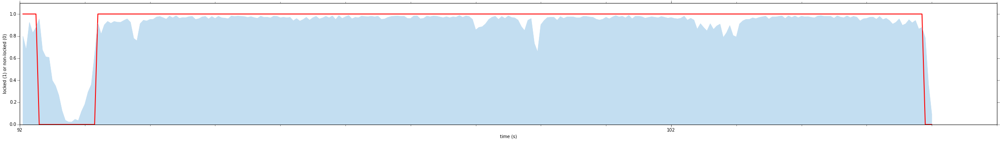

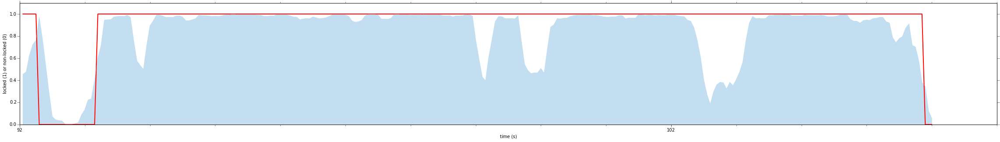

In [18]:
best_window_size = 3
movie_id = "05_02"
seat_id = "D"
start = 92
end = 106
fps = 20
path = os.path.join("./test_result/model_compare_lstm_02", "%s_%s.pickle" % (movie_id, seat_id))
labels, preds = pickle.load(open(path, "r"))
preds = [pred[1] for pred in preds]

labels = labels[start*fps:end*fps]
preds = preds[start*fps:end*fps]
frame_num = len(labels)
fig_path = "./figure/for_slide/lstm_%s_%s_%04d_%04d.png" % (movie_id, seat_id, start, end)
# title="LSTM: %s_%s (%d ~ %d)" % (movie_id, seat_id, start, end)
title = ""
utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=False, start_t=start)

frame_num = utils.frame_num(img_dir, movie_id)
labels = utils.load_ts(movie_id, seat_id, ant_dir, frame_num)
preds = utils.load_xs(movie_id, seat_id, prediction_dir, frame_num, "score")
preds = [float(pred) for pred in preds]
preds = smoothing_methods.pre_average_predictions(preds, window=best_window_size)

labels = labels[start*fps:end*fps]
preds = preds[start*fps:end*fps]
frame_num = len(labels)
# visualize result
fig_path = "./figure/for_slide/average_%s_%s_%04d_%04d.png" % (movie_id, seat_id, start, end)
# title="Average: %s_%s (%d ~ %d)" % (movie_id, seat_id, start, end)
title = ""
utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=False, start_t=start)


In [ ]:
# 05_01_D 62 ~ 74

Parsing unknown version of ELAN spec... This could result in errors...


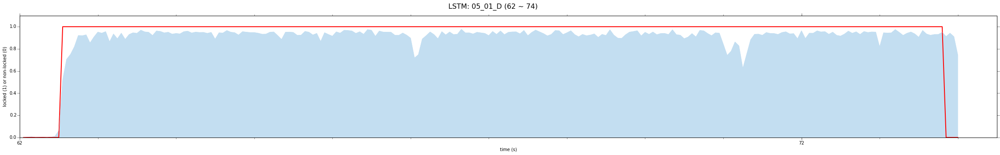

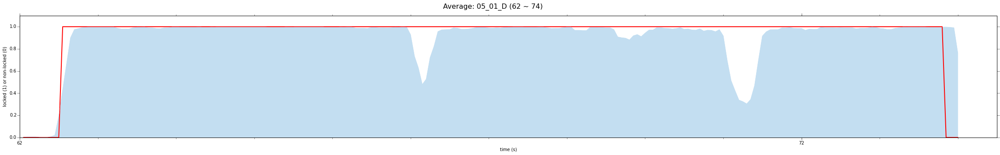

In [7]:
best_window_size = 3
movie_id = "05_01"
seat_id = "D"
start = 62
end = 74
fps = 20
path = os.path.join("./test_result/test_dialog_id_05", "%s_%s.pickle" % (movie_id, seat_id))
labels, preds = pickle.load(open(path, "r"))
preds = [pred[1] for pred in preds]

labels = labels[start*fps:end*fps]
preds = preds[start*fps:end*fps]
frame_num = len(labels)
fig_path = "./figure/for_slide/lstm_%s_%s_%04d_%04d.png" % (movie_id, seat_id, start, end)
title="LSTM: %s_%s (%d ~ %d)" % (movie_id, seat_id, start, end)
utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=False, start_t=start)

frame_num = utils.frame_num(img_dir, movie_id)
labels = utils.load_ts(movie_id, seat_id, ant_dir, frame_num)
preds = utils.load_xs(movie_id, seat_id, prediction_dir, frame_num, "score")
preds = [float(pred) for pred in preds]
preds = smoothing_methods.pre_average_predictions(preds, window=best_window_size)

labels = labels[start*fps:end*fps]
preds = preds[start*fps:end*fps]
frame_num = len(labels)
# visualize result
fig_path = "./figure/for_slide/average_%s_%s_%04d_%04d.png" % (movie_id, seat_id, start, end)
title="Average: %s_%s (%d ~ %d)" % (movie_id, seat_id, start, end)
utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=False, start_t=start)

In [ ]:
# 05_01_C 225 ~ 230

Parsing unknown version of ELAN spec... This could result in errors...


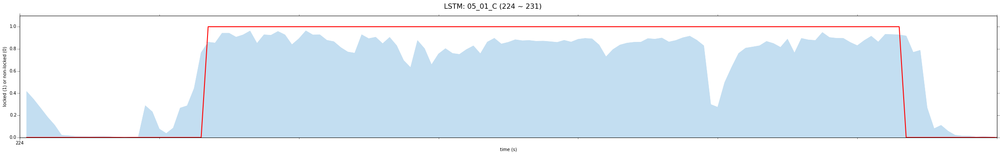

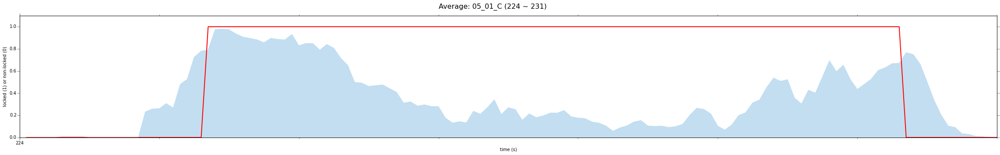

In [9]:
best_window_size = 3
movie_id = "05_01"
seat_id = "C"
start = 224
end = 231
fps = 20
path = os.path.join("./test_result/test_dialog_id_05", "%s_%s.pickle" % (movie_id, seat_id))
labels, preds = pickle.load(open(path, "r"))
preds = [pred[1] for pred in preds]

labels = labels[start*fps:end*fps]
preds = preds[start*fps:end*fps]
frame_num = len(labels)
fig_path = "./figure/for_slide/lstm_%s_%s_%04d_%04d.png" % (movie_id, seat_id, start, end)
title="LSTM: %s_%s (%d ~ %d)" % (movie_id, seat_id, start, end)
utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=False, start_t=start)

frame_num = utils.frame_num(img_dir, movie_id)
labels = utils.load_ts(movie_id, seat_id, ant_dir, frame_num)
preds = utils.load_xs(movie_id, seat_id, prediction_dir, frame_num, "score")
preds = [float(pred) for pred in preds]
preds = smoothing_methods.pre_average_predictions(preds, window=best_window_size)

labels = labels[start*fps:end*fps]
preds = preds[start*fps:end*fps]
frame_num = len(labels)
# visualize result
fig_path = "./figure/for_slide/average_%s_%s_%04d_%04d.png" % (movie_id, seat_id, start, end)
title="Average: %s_%s (%d ~ %d)" % (movie_id, seat_id, start, end)
utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=False, start_t=start)

Parsing unknown version of ELAN spec... This could result in errors...


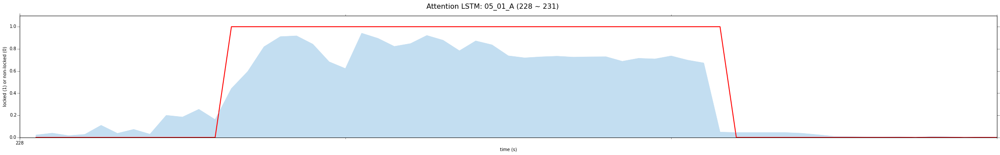

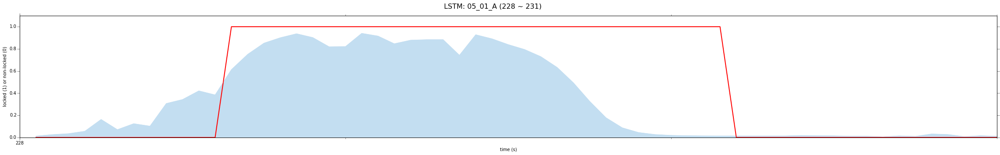

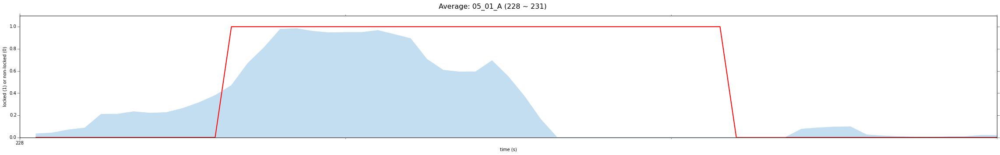

In [12]:
best_window_size = 3
movie_id = "05_01"
seat_id = "A"
start = 228
end = 231
fps = 20
path = os.path.join("./test_result/model_compare_atlstm_02", "%s_%s.pickle" % (movie_id, seat_id))
labels, preds = pickle.load(open(path, "r"))
preds = [pred[1] for pred in preds]

labels = labels[start*fps:end*fps]
preds = preds[start*fps:end*fps]
frame_num = len(labels)
fig_path = "./figure/for_slide/lstm_%s_%s_%04d_%04d.png" % (movie_id, seat_id, start, end)
title="Attention LSTM: %s_%s (%d ~ %d)" % (movie_id, seat_id, start, end)
utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=False, start_t=start)


path = os.path.join("./test_result/model_compare_lstm_02", "%s_%s.pickle" % (movie_id, seat_id))
labels, preds = pickle.load(open(path, "r"))
preds = [pred[1] for pred in preds]

labels = labels[start*fps:end*fps]
preds = preds[start*fps:end*fps]
frame_num = len(labels)
fig_path = "./figure/for_slide/lstm_%s_%s_%04d_%04d.png" % (movie_id, seat_id, start, end)
title="LSTM: %s_%s (%d ~ %d)" % (movie_id, seat_id, start, end)
utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=False, start_t=start)


frame_num = utils.frame_num(img_dir, movie_id)
labels = utils.load_ts(movie_id, seat_id, ant_dir, frame_num)
preds = utils.load_xs(movie_id, seat_id, prediction_dir, frame_num, "score")
preds = [float(pred) for pred in preds]
preds = smoothing_methods.pre_average_predictions(preds, window=best_window_size)

labels = labels[start*fps:end*fps]
preds = preds[start*fps:end*fps]
frame_num = len(labels)
# visualize result
fig_path = "./figure/for_slide/average_%s_%s_%04d_%04d.png" % (movie_id, seat_id, start, end)
title="Average: %s_%s (%d ~ %d)" % (movie_id, seat_id, start, end)
utils.visualize(labels, preds, frame_num, title=title, fig_path=fig_path, big=False, start_t=start)